In [1]:
import numpy as np
import seaborn as sns
import scipy.stats as stats
import statsmodels.api as sm
from statsmodels.formula.api import ols

In [2]:
import descartes
import pandas as pd
import matplotlib.pyplot as plt
import geopandas as gpd
from shapely.geometry import Point, Polygon

In [3]:
df = pd.DataFrame(pd.read_pickle('data/cleaned_df.pkl'))

In [4]:
df = df[df.sqft_living < 8000]

# Working with Models

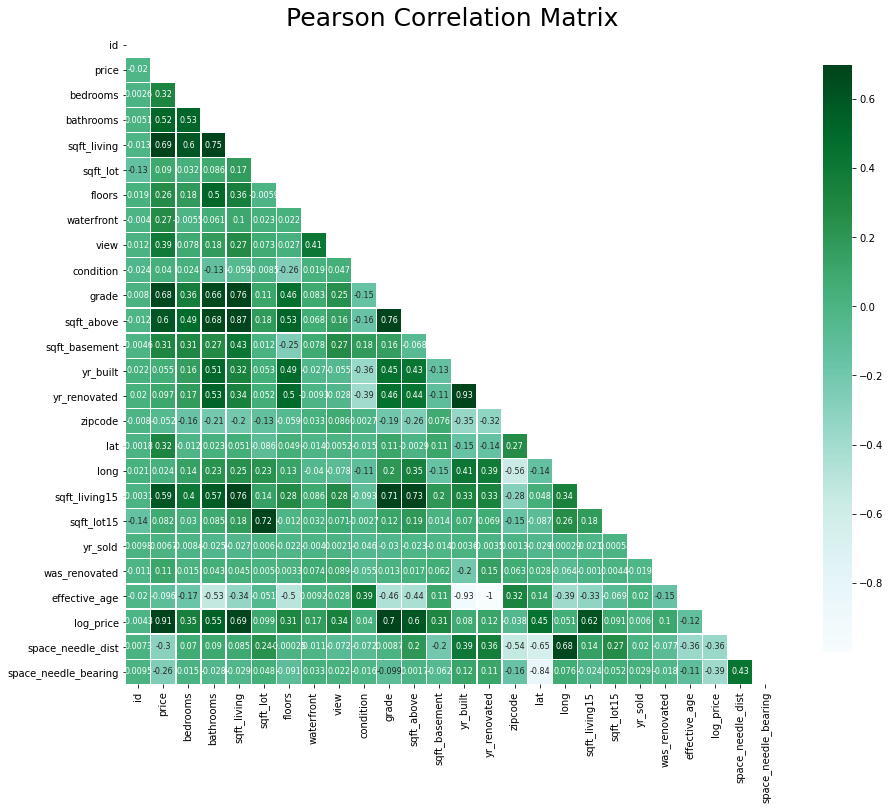

In [5]:
features = list(df.columns)

mask = np.zeros_like(df[features].corr(), dtype=np.bool) 
mask[np.triu_indices_from(mask)] = True 

f, ax = plt.subplots(figsize=(16, 12))
plt.title('Pearson Correlation Matrix',fontsize=25)

sns.heatmap(df[features].corr(),linewidths=0.25,vmax=0.7,square=True,cmap="BuGn", #"BuGn_r" to reverse 
            linecolor='w',annot=True,annot_kws={"size":8},mask=mask,cbar_kws={"shrink": .9});


In [7]:
from sklearn.model_selection import train_test_split

train_set, test_set = train_test_split(df, test_size=0.2, random_state=16)

In [8]:
%matplotlib inline
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

train_lat_long_logprice = train_set[['lat', 'long']]

train_scaled = scaler.fit_transform(train_lat_long_logprice)
pd.DataFrame(train_scaled).describe()

,0,1
count,1.726900e+04,1.726900e+04
mean,2.989595e-14,5.517209e-15
std,1.000029e+00,1.000029e+00
min,-2.912024e+00,-2.166252e+00
25%,-6.526990e-01,-8.118653e-01
50%,8.865324e-02,-1.169447e-01
75%,8.501588e-01,6.347042e-01
max,1.562721e+00,6.371345e+00


/Users/npardue/anaconda3/envs/maps/lib/python3.6/site-packages/sklearn/cluster/_kmeans.py:974: FutureWarning: 'n_jobs' was deprecated in version 0.23 and will be removed in 0.25.
  " removed in 0.25.", FutureWarning)
/Users/npardue/anaconda3/envs/maps/lib/python3.6/site-packages/sklearn/cluster/_kmeans.py:974: FutureWarning: 'n_jobs' was deprecated in version 0.23 and will be removed in 0.25.
  " removed in 0.25.", FutureWarning)
/Users/npardue/anaconda3/envs/maps/lib/python3.6/site-packages/sklearn/cluster/_kmeans.py:974: FutureWarning: 'n_jobs' was deprecated in version 0.23 and will be removed in 0.25.
  " removed in 0.25.", FutureWarning)
/Users/npardue/anaconda3/envs/maps/lib/python3.6/site-packages/sklearn/cluster/_kmeans.py:974: FutureWarning: 'n_jobs' was deprecated in version 0.23 and will be removed in 0.25.
  " removed in 0.25.", FutureWarning)
/Users/npardue/anaconda3/envs/maps/lib/python3.6/site-packages/sklearn/cluster/_kmeans.py:974: FutureWarning: 'n_jobs' was deprecate

Text(0, 0.5, 'Inertia')

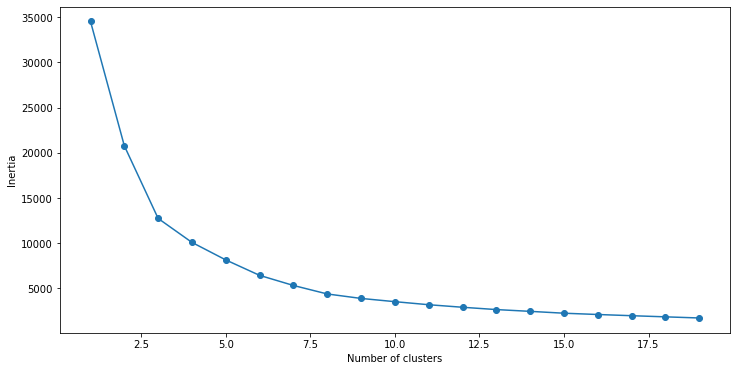

In [9]:
SSE = []
for cluster in range(1,20):
    kmeans = KMeans(n_jobs = -1, n_clusters = cluster, init='k-means++')
    kmeans.fit(train_scaled)
    SSE.append(kmeans.inertia_)

# converting the results into a dataframe and plotting them
frame = pd.DataFrame({'Cluster':range(1,20), 'SSE':SSE})
plt.figure(figsize=(12,6))
plt.plot(frame['Cluster'], frame['SSE'], marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')

In [10]:
kmeans = KMeans(n_jobs = -1, n_clusters = 6, init='k-means++', random_state=16)
kmeans.fit(train_scaled)
train_pred = kmeans.predict(train_scaled)


train_frame = pd.DataFrame(train_scaled)
train_frame['cluster'] = train_pred
train_frame['cluster'].value_counts()

train_centers = kmeans.cluster_centers_
train_centers_frame = pd.DataFrame(scaler.inverse_transform(train_centers), columns=['klat', 'klong'])
train_centers_frame.sort_values(by='klat', inplace=True)
train_centers_frame.reset_index(drop=True, inplace=True)
train_centers_frame

/Users/npardue/anaconda3/envs/maps/lib/python3.6/site-packages/sklearn/cluster/_kmeans.py:974: FutureWarning: 'n_jobs' was deprecated in version 0.23 and will be removed in 0.25.
  " removed in 0.25.", FutureWarning)


,klat,klong
0,47.331219,-122.302298
1,47.392456,-122.116310
2,47.534714,-122.314791
3,47.557735,-121.924715
4,47.653663,-122.122049
5,47.695238,-122.325940


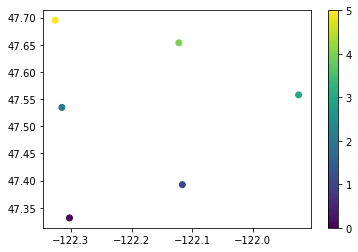

In [11]:
plt.scatter(train_centers_frame.klong, train_centers_frame.klat, c = train_centers_frame.index,
           label = train_centers_frame.index)
plt.colorbar()

In [113]:
train_centers_frame.items

<bound method DataFrame.items of         klat       klong
0  47.331219 -122.302298
1  47.392456 -122.116310
2  47.534714 -122.314791
3  47.557735 -121.924715
4  47.653663 -122.122049
5  47.695238 -122.325940>

In [146]:
for i in train_centers_frame:
    train_centers_frame['size'] = .5

In [147]:
import plotly.express as px
mapbox_token = 'pk.eyJ1IjoibnBhcmR1ZSIsImEiOiJja2NkdmszamkwMGpoMndwNjZvcTB3OWF2In0.oab4wnhdjwGV7tghW4nVPQ' 
px.set_mapbox_access_token(mapbox_token)
fig = px.scatter_mapbox(train_centers_frame, lat="klat", lon="klong", size='size',
                        title='Geographic Points of Interest',
                        hover_data = [train_centers_frame.klat, train_centers_frame.klong],
                        center = coordinates,
                        zoom=8.4, width = 900, height = 650)

fig.show() 

/Users/npardue/anaconda3/envs/maps/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



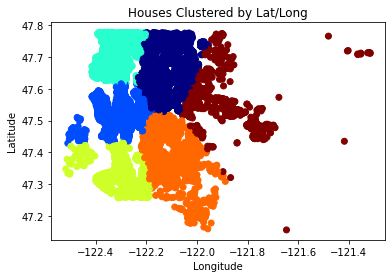

In [148]:
train_set['cluster'] = train_pred
plt.scatter(train_set.long, train_set.lat, c=train_set.cluster)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Houses Clustered by Lat/Long')
plt.show()

In [13]:
def distance_from(flat, flong, lat, long):
    """return 'as the crow flies' distance in miles from the 
    space needle, given latitude and longitude coordinates of a location"""
    # Convert lat/longitudes to radians
    def to_radians(latlong):
        return latlong / 57.29577951
    # lat/long of input
    loc_lat = to_radians(lat)
    loc_long = to_radians(long)
    c_lat = to_radians(flat)
    c_long = to_radians(flong)
    # distance in miles
    d = 3963.0 * np.arccos((np.sin(c_lat) * np.sin(loc_lat))\
                           + np.cos(c_lat) * np.cos(loc_lat)\
                           * np.cos(loc_long - c_long))
    return d

    
# Create a Function for computing the bearing relative from space needle
# of a given lat/long point
def bearing_from(flat, flong, lat, long):
    """return bearing theta in radians for given location's
    bearing relative to the space needle. Takes latitude and longitude
    of the location."""
    delta_fi = np.log(np.tan(flat / 2 + np.pi/4) / np.tan(lat / 2 + np.pi/4))
    delta_lon = abs(flong - long)
    bearing = np.arctan2(delta_lon, delta_fi)
    return bearing

In [17]:
for i in train_centers_frame.index:
    dist_col_name = f'dist_c{i}'
    bear_col_name = f'bear_c{i}'
    train_set[dist_col_name] = distance_from(train_centers_frame.loc[i, 'klat'], train_centers_frame.loc[i, 'klong'], train_set.lat, train_set.long)
    train_set[bear_col_name] = bearing_from(train_centers_frame.loc[i, 'klat'], train_centers_frame.loc[i, 'klong'], train_set.lat, train_set.long)


train_set.head()

/Users/npardue/anaconda3/envs/maps/lib/python3.6/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.
/Users/npardue/anaconda3/envs/maps/lib/python3.6/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """


,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,dist_c1,bear_c1,dist_c2,bear_c2,dist_c3,bear_c3,dist_c4,bear_c4,dist_c5,bear_c5
12702,5014000085,2014-06-23,425000.0,2,1.0,880,6413,1.0,0.0,0.0,...,18.045764,0.964710,4.586021,1.087219,21.973816,1.534911,13.896288,1.894023,9.046852,2.683960
10450,6056100295,2014-05-30,330000.0,2,2.5,1240,1546,2.0,0.0,0.0,...,14.558305,0.783091,2.133348,0.489868,17.427405,1.554051,10.310152,2.096432,9.211411,2.958453
10209,8947250060,2015-03-26,292500.0,4,2.5,1610,4568,2.0,NaN,0.0,...,9.010814,1.900305,13.859445,3.019444,22.967160,2.144368,23.374730,2.689356,24.969493,3.047739
7095,9297300480,2014-12-12,765000.0,4,3.5,2760,4000,2.0,0.0,2.0,...,17.137966,0.939509,3.628440,1.007969,20.982928,1.543837,13.136203,1.935532,9.034412,2.821521
19486,8151600900,2014-11-12,445000.0,5,3.0,2420,11250,2.0,0.0,0.0,...,14.005333,1.108986,2.868067,2.117938,20.706362,1.693659,15.052043,2.165536,13.045766,2.972410


In [19]:
import statsmodels.formula.api as smf

In [20]:
col_combos = [f'+ dist_c{i}*bear_c{i} ' for i in train_centers_frame.index]
formula = 'log_price ~ sqft_living ' + ''.join(col_combos)

model = smf.ols(formula=formula, data=train_set)
fitted_model = model.fit()

fitted_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              log_price   R-squared:                       0.804
Model:                            OLS   Adj. R-squared:                  0.804
Method:                 Least Squares   F-statistic:                     3735.
Date:                Thu, 09 Jul 2020   Prob (F-statistic):               0.00
Time:                        18:24:17   Log-Likelihood:                 681.34
No. Observations:               17269   AIC:                            -1323.
Df Residuals:                   17249   BIC:                            -1168.
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
===================================================================================
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
Intercept          13.5876      0.075    182.076      0.000      13.441      13.734
sqft_living         0.0004   2.11e-06    175.926      0.000       0.000       0.000
dist_c0            -0.0407      0.004    -10.419      0.000      -0.048      -0.033
bear_c0             0.0405      0.011      3.568      0.000       0.018       0.063
dist_c0:bear_c0    -0.0041      0.002     -1.815      0.070      -0.008       0.000
dist_c1            -0.0140      0.005     -2.892      0.004      -0.023      -0.004
bear_c1             0.0007      0.010      0.072      0.943      -0.019       0.020
dist_c1:bear_c1     0.0232      0.002     11.063      0.000       0.019       0.027
dist_c2            -0.0470      0.005     -9.833      0.000      -0.056      -0.038
bear_c2            -0.1289      0.010    -13.361      0.000      -0.148      -0.110
dist_c2:bear_c2     0.0520      0.003     18.426      0.000       0.046       0.058
dist_c3            -0.0050      0.004     -1.158      0.247      -0.014       0.003
bear_c3             0.0961      0.017      5.545      0.000       0.062       0.130
dist_c3:bear_c3     0.0191      0.002      8.837      0.000       0.015       0.023
dist_c4            -0.0190      0.004     -4.277      0.000      -0.028      -0.010
bear_c4             0.0188      0.008      2.228      0.026       0.002       0.035
dist_c4:bear_c4    -0.0151      0.002     -6.817      0.000      -0.019      -0.011
dist_c5             0.1297      0.006     22.235      0.000       0.118       0.141
bear_c5             0.2044      0.008     25.459      0.000       0.189       0.220
dist_c5:bear_c5    -0.0874      0.003    -29.885      0.000      -0.093      -0.082
==============================================================================
Omnibus:                     1091.698   Durbin-Watson:                   2.015
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             4176.247
Skew:                           0.213   Prob(JB):                         0.00
Kurtosis:                       5.371   Cond. No.                     9.65e+04
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 9.65e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [21]:
cols = list(fitted_model.pvalues[fitted_model.pvalues < .05].index[1:])
cols
formula = 'log_price ~ '
formula_join = '+ '.join(cols)
formula += formula_join

In [22]:
# train_set.columns[-10:]
cols = list(train_set.columns[-12:])
cols.append('sqft_living')

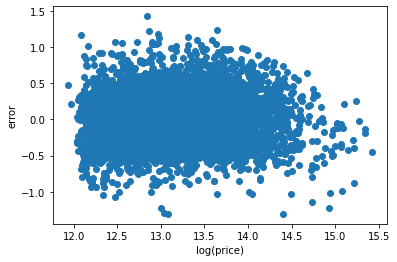

In [23]:
x_preds = train_set[cols]
y_actual = train_set['log_price']
model_predictions = fitted_model.predict(x_preds)
residuals = y_actual - model_predictions

# test_x_preds = test_set[cols]
# test_y_actual = test_set['log_price']
# test_model_predictions = fitted_model.predict(test_x_preds)
# test_residuals = test_y_actual - test_model_predictions

plt.scatter(model_predictions, residuals)
#plt.scatter(test_model_predictions, test_residuals)


plt.ylabel('error')
plt.xlabel('log(price)')
plt.show()

In [26]:
"""Cell returns error:
Error evaluating factor: NameError: name 'dist_c1' is not defined

VERY briefly checked notebook above, but did not see where error arises"""

for i in train_centers_frame.index:
    dist_col_name = f'dist_c{i}'
    bear_col_name = f'bear_c{i}'
    test_set[dist_col_name] = distance_from(train_centers_frame.loc[i, 'klat'], train_centers_frame.loc[i, 'klong'], test_set.lat, test_set.long)
    test_set[bear_col_name] = bearing_from(train_centers_frame.loc[i, 'klat'], train_centers_frame.loc[i, 'klong'], test_set.lat, test_set.long)

cols = list(test_set.columns[-12:])
cols.append('sqft_living')

test_x_preds = test_set[cols]

test_preds = fitted_model.predict(test_x_preds)

log_price_mean = test_set.log_price.mean()
TSS = ((test_set.log_price - (log_price_mean))**2).sum()
RSS = ((test_set.log_price - test_preds)**2).sum()

R_sq = 1 - (RSS / TSS)

R_sq

/Users/npardue/anaconda3/envs/maps/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if __name__ == '__main__':
/Users/npardue/anaconda3/envs/maps/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.


0.8001754932831665

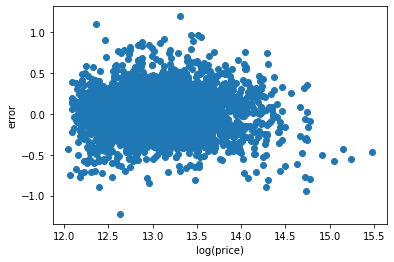

In [28]:
#Calculating Residuals for Test Set
test_x_preds = test_set[cols]
test_y_actual = test_set['log_price']
test_model_predictions = fitted_model.predict(test_x_preds)
test_residuals = test_y_actual - test_model_predictions

plt.scatter(test_model_predictions, test_residuals)

plt.ylabel('error')
plt.xlabel('log(price)')
plt.show()

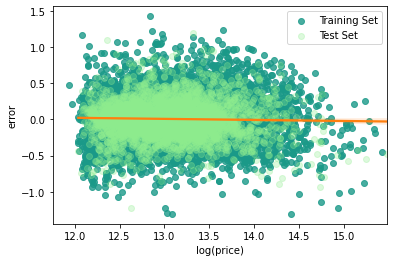

In [93]:
sns.regplot(model_predictions, residuals, fit_reg=False,
            scatter_kws={"color":"#1a9988"},
            label='Training Set')

sns.regplot(test_model_predictions, test_residuals, fit_reg=True,
            scatter_kws={"color":"lightgreen", 'alpha':0.3},
            label='Test Set')

plt.legend()
plt.ylabel('error')
plt.xlabel('log(price)')
plt.show()

# Everything of use should be above this cell

In [6]:
areas_map = gpd.read_file('Incorporated_Areas_of_King_County___citydst_area.shp')

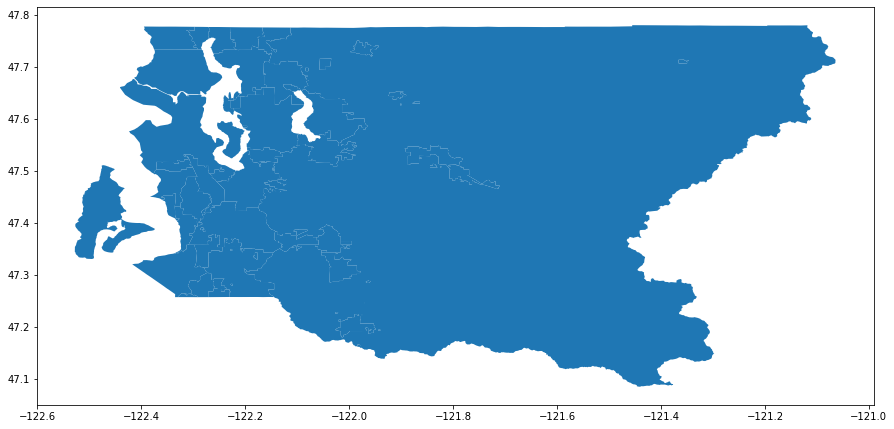

In [12]:
fig, ax = plt.subplots(figsize=(15,15))
areas_map.plot(ax=ax)

In [94]:
import plotly.express as px
mapbox_token = 'pk.eyJ1IjoibnBhcmR1ZSIsImEiOiJja2NkdmszamkwMGpoMndwNjZvcTB3OWF2In0.oab4wnhdjwGV7tghW4nVPQ' 
px.set_mapbox_access_token(mapbox_token)

fig = px.scatter_mapbox(df.loc[df.log_price>15], lat="lat", lon="long", color="sqft_living", 
                        size="sqft_living",\
#                         color_continuous_scale=px.colors.cyclical.IceFire, 
                        size_max=15, zoom=10)
fig.show()

In [61]:
len(df.loc[df.waterfront == 1])

146

In [78]:
poss_outliers = df.loc[df.log_price>15]

In [79]:
poss_outliers.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,lat,long,sqft_living15,sqft_lot15,yr_sold,was_renovated,effective_age,log_price,space_needle_dist,space_needle_bearing
1162,1247600105,2014-10-20,5110000.0,5,5.25,8010,45517,2.0,1.0,4.0,...,47.6767,-122.211,3430,26788,2014,False,15.0,15.446710,7.525897,1.131737
1313,7558700030,2015-04-13,5300000.0,6,6.00,7390,24829,2.0,1.0,NaN,...,47.5631,-122.210,4320,24619,2015,False,24.0,15.483217,7.614833,2.003404
1446,8907500070,2015-04-13,5350000.0,5,5.00,8000,23985,2.0,0.0,4.0,...,47.6232,-122.220,4600,21750,2015,False,6.0,15.492607,6.030891,1.547033
2083,8106100105,2014-11-14,3850000.0,4,4.25,5770,21300,2.0,1.0,4.0,...,47.5850,-122.222,4620,22748,2014,False,34.0,15.163584,6.424662,1.875262
2442,7524900003,2014-12-10,3280000.0,2,1.75,6840,10000,2.5,1.0,4.0,...,47.6042,-122.112,3120,12300,2014,False,13.0,15.003354,11.122283,1.648427


In [80]:
poss_outliers.sqft_living.describe()

count       32.00000
mean      6699.68750
std       1911.79781
min       4220.00000
25%       5320.00000
50%       6315.00000
75%       7782.50000
max      12050.00000
Name: sqft_living, dtype: float64

In [81]:
poss_outliers.loc[poss_outliers.waterfront == 1]

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,lat,long,sqft_living15,sqft_lot15,yr_sold,was_renovated,effective_age,log_price,space_needle_dist,space_needle_bearing
1162,1247600105,2014-10-20,5110000.0,5,5.25,8010,45517,2.0,1.0,4.0,...,47.6767,-122.211,3430,26788,2014,False,15.0,15.446710,7.525897,1.131737
1313,7558700030,2015-04-13,5300000.0,6,6.00,7390,24829,2.0,1.0,NaN,...,47.5631,-122.210,4320,24619,2015,False,24.0,15.483217,7.614833,2.003404
2083,8106100105,2014-11-14,3850000.0,4,4.25,5770,21300,2.0,1.0,4.0,...,47.5850,-122.222,4620,22748,2014,False,34.0,15.163584,6.424662,1.875262
2442,7524900003,2014-12-10,3280000.0,2,1.75,6840,10000,2.5,1.0,4.0,...,47.6042,-122.112,3120,12300,2014,False,13.0,15.003354,11.122283,1.648427
2624,7738500731,2014-08-15,4500000.0,5,5.50,6640,40014,2.0,1.0,4.0,...,47.7493,-122.280,3030,23408,2014,False,10.0,15.319588,9.475167,0.427010
2862,4114601570,2014-11-18,3600000.0,3,3.25,5020,12431,2.0,1.0,4.0,...,47.5925,-122.287,3680,12620,2014,True,12.0,15.096444,3.491632,2.040358
3910,9808700762,2014-06-11,7060000.0,5,4.50,10040,37325,2.0,1.0,2.0,...,47.6500,-122.214,3930,25449,2014,True,13.0,15.769956,6.627995,1.325789
6502,4217402115,2015-04-21,3650000.0,6,4.75,5480,19401,1.5,1.0,4.0,...,47.6515,-122.277,3510,15810,2015,False,79.0,15.110238,3.994076,1.113648
7982,9362000040,2014-06-23,3400000.0,3,4.50,5230,17826,2.0,1.0,4.0,...,47.5348,-122.243,3670,17826,2014,False,9.0,15.039286,7.729023,2.302164
8085,1924059029,2014-06-17,4670000.0,5,6.75,9640,13068,1.0,1.0,4.0,...,47.5570,-122.210,3270,10454,2014,True,5.0,15.356670,7.843395,2.042487


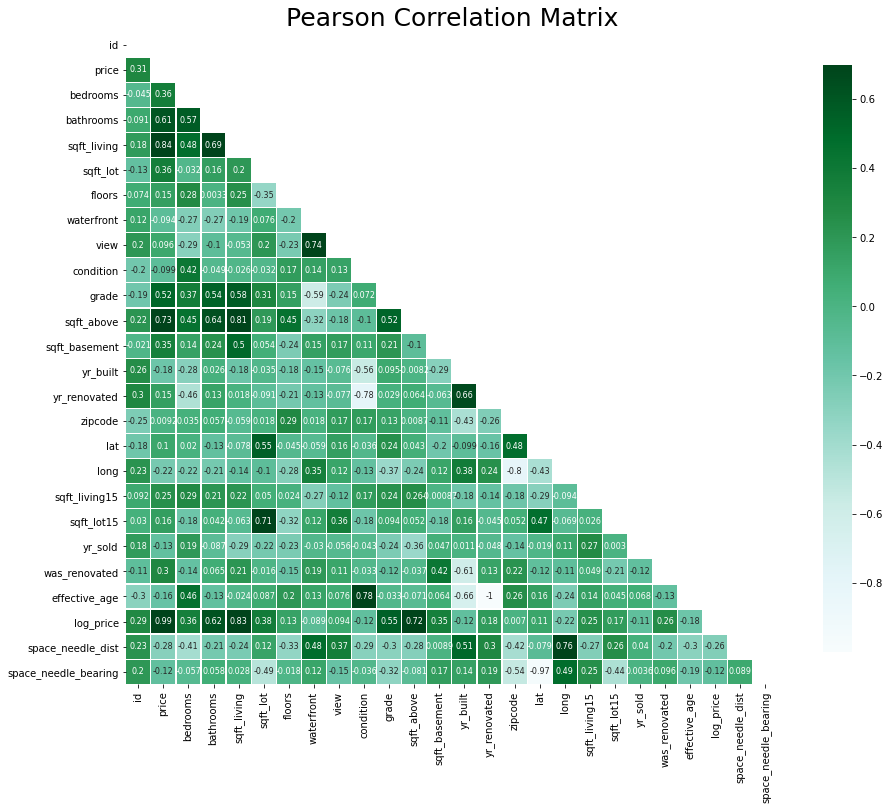

In [83]:
features = list(df.columns)

mask = np.zeros_like(df[features].corr(), dtype=np.bool) 
mask[np.triu_indices_from(mask)] = True 

f, ax = plt.subplots(figsize=(16, 12))
plt.title('Pearson Correlation Matrix',fontsize=25)

sns.heatmap(poss_outliers[features].corr(),linewidths=0.25,vmax=0.7,square=True,cmap="BuGn", #"BuGn_r" to reverse 
            linecolor='w',annot=True,annot_kws={"size":8},mask=mask,cbar_kws={"shrink": .9});


In [86]:
df.loc[df.log_price > 15.5]

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,lat,long,sqft_living15,sqft_lot15,yr_sold,was_renovated,effective_age,log_price,space_needle_dist,space_needle_bearing
3910,9808700762,2014-06-11,7060000.0,5,4.50,10040,37325,2.0,1.0,2.0,...,47.6500,-122.214,3930,25449,2014,True,13.0,15.769956,6.627995,1.325789
4407,2470100110,2014-08-04,5570000.0,5,5.75,9200,35069,2.0,0.0,0.0,...,47.6289,-122.233,3560,24345,2014,False,13.0,15.532906,5.452683,1.488643
7245,6762700020,2014-10-13,7700000.0,6,8.00,12050,27600,2.5,0.0,3.0,...,47.6298,-122.323,3940,8800,2014,True,27.0,15.856731,1.384537,1.187518
9245,9208900037,2014-09-19,6890000.0,6,7.75,9890,31374,2.0,0.0,4.0,...,47.6305,-122.240,4540,42730,2014,False,13.0,15.745582,5.141971,1.466826


In [91]:
len(list(poss_outliers.columns))

27

In [93]:
df.shape

(21597, 27)

In [100]:
def find_map_center(df, lat, long):
    """A function for finding the center of a list of given coordinates. Returns a dictionary
    -------------------------------------------------------------------
    df: a pandas dataframe
    lat: string. the dataframe column that contains the latitude values
    long: string. the dataframe column that contains the longitude values"""
    mid_lat = (df[lat].sort_values().iloc[0] + df[lat].sort_values().iloc[-1]) / 2
    mid_long = (df[long].sort_values().iloc[0] + df[long].sort_values().iloc[-1]) / 2
    return {"lat": mid_lat, "lon": mid_long}
coordinates = find_map_center(df, "lat", "long")

In [101]:
import plotly.express as px
mapbox_token = 'pk.eyJ1IjoibnBhcmR1ZSIsImEiOiJja2NkdmszamkwMGpoMndwNjZvcTB3OWF2In0.oab4wnhdjwGV7tghW4nVPQ' 
px.set_mapbox_access_token(mapbox_token)
fig = px.scatter_mapbox(df, lat="lat", lon="long", color="log_price",
                        title='Houses Color Coded by log_price',
                        hover_data = [df.lat, df.long, df.price],
                        center = coordinates,
                        zoom=8.4, width = 900, height = 650)

fig.show() 

In [105]:
import plotly.express as px
mapbox_token = 'pk.eyJ1IjoibnBhcmR1ZSIsImEiOiJja2NkdmszamkwMGpoMndwNjZvcTB3OWF2In0.oab4wnhdjwGV7tghW4nVPQ' 
px.set_mapbox_access_token(mapbox_token)
fig = px.scatter_mapbox(train_centers_frame, lat="klat", lon="klong", #color=train_centers_frame.index,
                        title='Houses Color Coded by log_price',
                        hover_data = [train_centers_frame.klat, train_centers_frame.klong],
                        center = coordinates,
                        zoom=8.4, width = 900, height = 650)

fig.show() 

In [180]:
zipcodes_map = gpd.read_file('Zipcodes_for_King_County.shp')

In [197]:
df.columns

Index(['id', 'date', 'price', 'bedrooms', 'bathrooms', 'sqft_living',
       'sqft_lot', 'floors', 'waterfront', 'view', 'condition', 'grade',
       'sqft_above', 'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode',
       'lat', 'long', 'sqft_living15', 'sqft_lot15', 'yr_sold',
       'was_renovated', 'effective_age', 'log_price', 'space_needle_dist',
       'space_needle_bearing', 'log_price_sn_dist'],
      dtype='object')

In [200]:
gdf = gpd.GeoDataFrame(
    df, geometry=gpd.points_from_xy(df.long, df.lat))

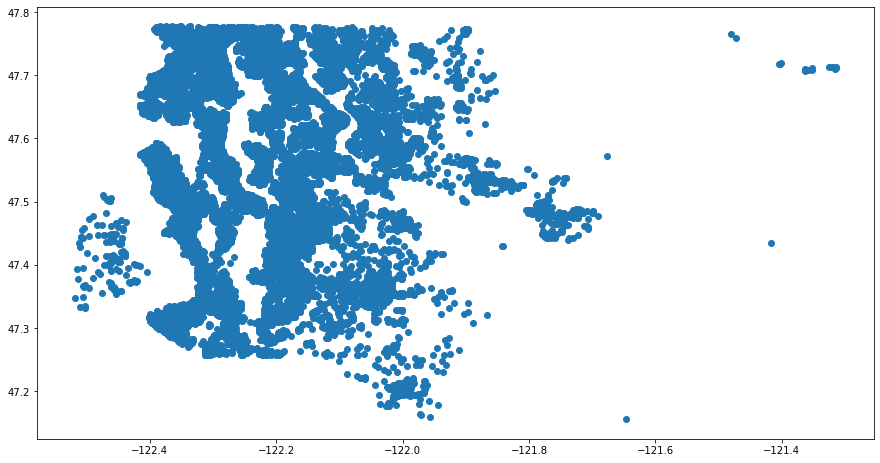

In [201]:
fig,ax = plt.subplots(figsize = (15,15))
gdf.plot(ax = ax)

In [202]:
klat_klong = {47.331219:-122.302298, 47.392458:-122.116346, 47.534679:-122.314847, 47.558268:-121.925526,
             47.653871:-122.122604, 47.695203:-122.326117}

In [203]:
klat_klong

{47.331219: -122.302298,
 47.392458: -122.116346,
 47.534679: -122.314847,
 47.558268: -121.925526,
 47.653871: -122.122604,
 47.695203: -122.326117}

In [204]:
ref_points = pd.DataFrame(list(klat_klong.items()), columns = ['lat', 'long'])
ref_points

,lat,long
0,47.331219,-122.302298
1,47.392458,-122.116346
2,47.534679,-122.314847
3,47.558268,-121.925526
4,47.653871,-122.122604
5,47.695203,-122.326117


In [215]:
import plotly.express as px
mapbox_token = 'pk.eyJ1IjoibnBhcmR1ZSIsImEiOiJja2NkdmszamkwMGpoMndwNjZvcTB3OWF2In0.oab4wnhdjwGV7tghW4nVPQ' 
px.set_mapbox_access_token(mapbox_token)
fig = px.scatter_mapbox(ref_points, lat="lat", lon="long",
                        title='Houses Color Coded by log_price',
                        hover_data = [ref_points.lat, ref_points.long],
                        center = coordinates,
                        zoom=8.4, width = 900, height = 650)

fig.show() 

In [228]:
ref_points.index

RangeIndex(start=0, stop=6, step=1)

In [247]:
import plotly.express as px
mapbox_token = 'pk.eyJ1IjoibnBhcmR1ZSIsImEiOiJja2NkdmszamkwMGpoMndwNjZvcTB3OWF2In0.oab4wnhdjwGV7tghW4nVPQ' 
px.set_mapbox_access_token(mapbox_token)
fig = px.scatter_mapbox(ref_points, lat="lat", lon="long", color=ref_points.index,
                        title='Houses Color Coded by log_price',
                        hover_data = [ref_points.lat, ref_points.long],
                        center = coordinates,
                        zoom=8.4, width = 900, height = 650)
fig.update_traces(marker=dict(size=12))


sub_fig = px.scatter_mapbox(df, lat="lat", lon="long", color=(df.index)/6,
                      #  title='Houses Color Coded by log_price',
                        hover_data = [df.lat, df.long, df.price],
                        center = coordinates,
                        zoom=8.4, width = 900, height = 650)

sub_fig.update_traces(marker=dict(size=4), opacity=0.5)

sub_fig.show()
fig.show() 